In [ ]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow
from google.colab import drive
import matplotlib.pyplot as plt
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
def evaluate_binarization(ground_truth, binarized_image):
    if len(ground_truth.shape) == 3:
        ground_truth = cv2.cvtColor(ground_truth, cv2.COLOR_BGR2GRAY)
    ground_truth=cv2.bitwise_not(ground_truth)
    binarized_image=cv2.bitwise_not(binarized_image)
    # Calculate True Positives, False Positives, False Negatives
    tp = np.sum(np.logical_and(ground_truth, binarized_image))
    fp = np.sum(np.logical_and(np.logical_not(ground_truth), binarized_image))
    fn = np.sum(np.logical_and(ground_truth, np.logical_not(binarized_image)))

    # Calculate F1 score
    precision = tp / (tp + fp + 1e-9)
    recall = tp / (tp + fn + 1e-9)
    f1_score = 2 * (precision * recall) / (precision + recall + 1e-9)

    # Calculate Intersection over Union (IoU)
    intersection = np.logical_and(ground_truth, binarized_image)
    union = np.logical_or(ground_truth, binarized_image)
    iou = np.sum(intersection) / np.sum(union)

    # Print evaluation metrics
    print("Intersection over Union (IoU):", iou)
    print("F1 Score:", f1_score)

    return

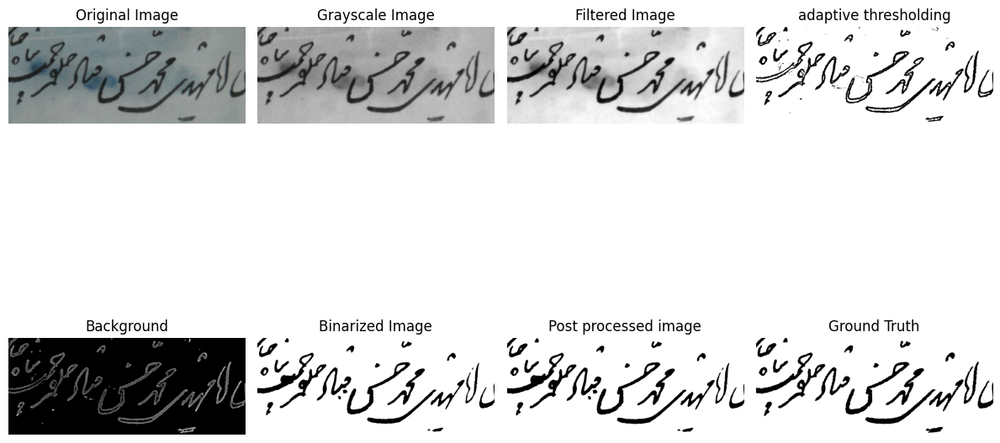

Intersection over Union (IoU): 0.8331939310543309
F1 Score: 0.9090079521675692
Binarization complete for Persian01.jpg


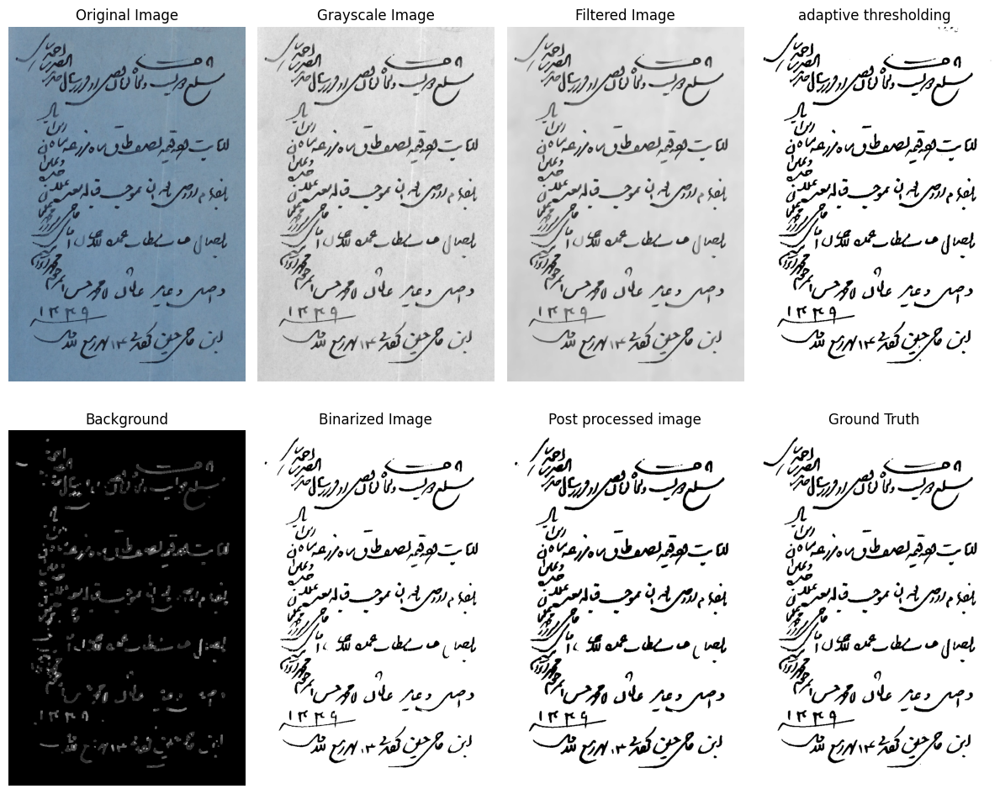

Intersection over Union (IoU): 0.8587147822228796
F1 Score: 0.9239876822126384
Binarization complete for Persian05.jpg


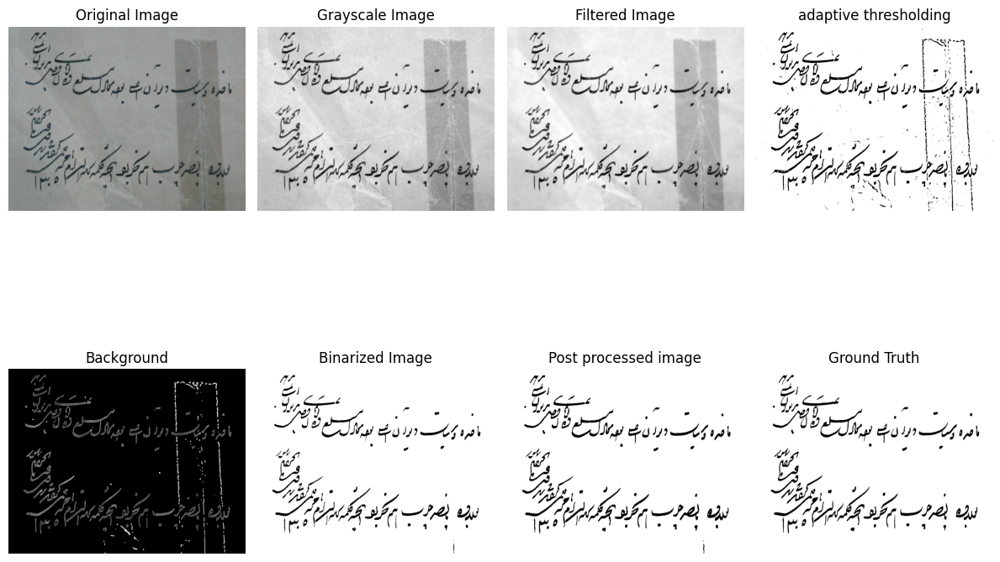

Intersection over Union (IoU): 0.8674396396548665
F1 Score: 0.9290149151482661
Binarization complete for Persian06.jpg


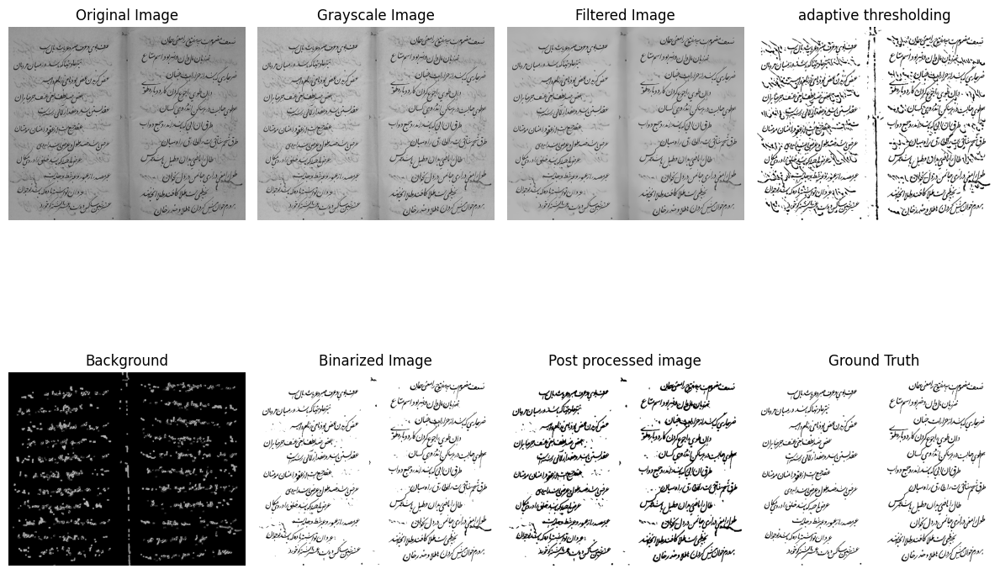

Intersection over Union (IoU): 0.8342623886230962
F1 Score: 0.9096434548720791
Binarization complete for Persian07.jpg


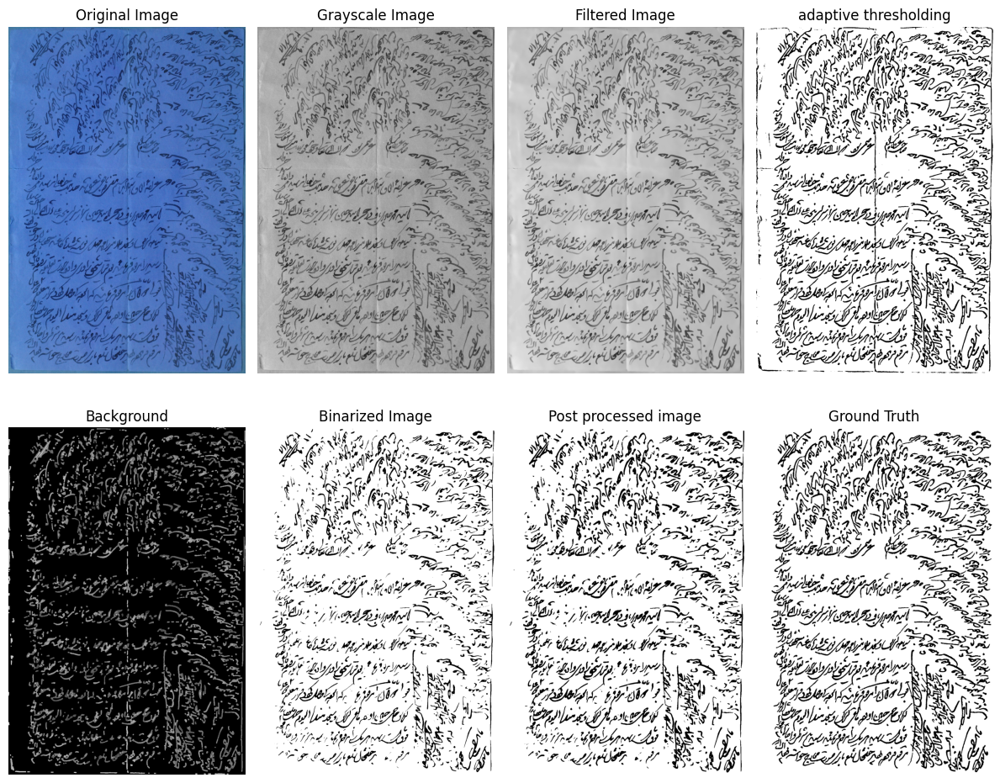

Intersection over Union (IoU): 0.6245763282530133
F1 Score: 0.7689097975918843
Binarization complete for Persian09.jpg


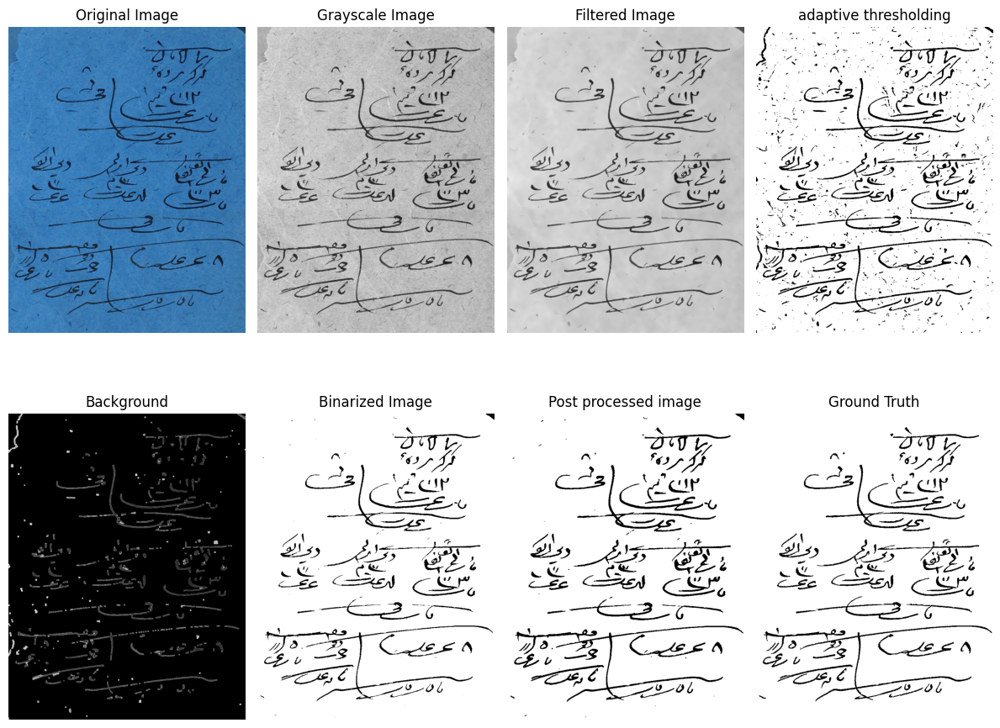

Intersection over Union (IoU): 0.8669516776784557
F1 Score: 0.9287349936031543
Binarization complete for Persian10.jpg


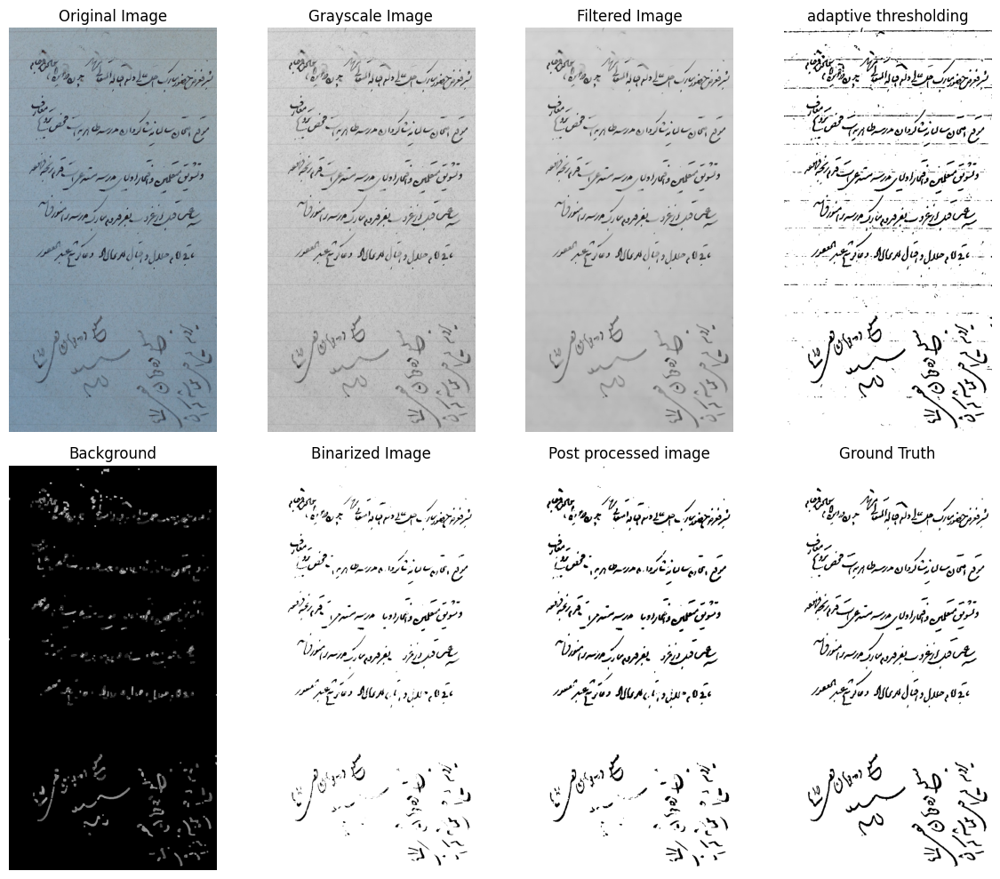

Intersection over Union (IoU): 0.6235938029273859
F1 Score: 0.7681647976455769
Binarization complete for Persian11.jpg


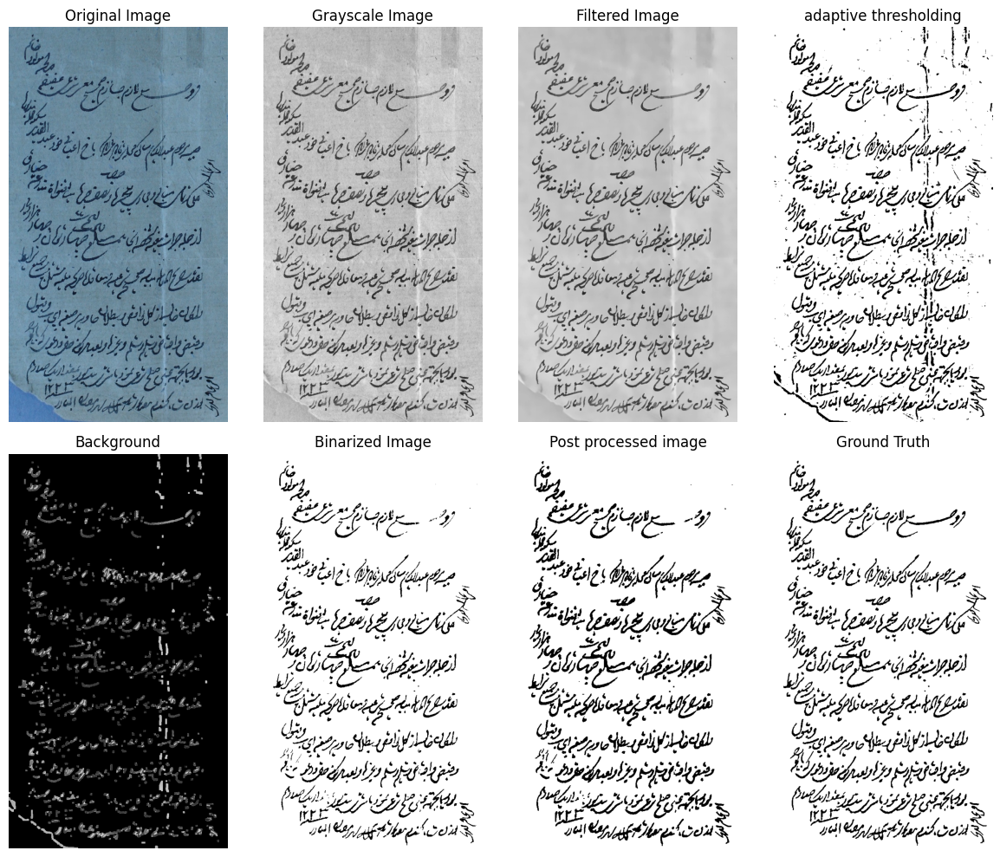

Intersection over Union (IoU): 0.8557315980572453
F1 Score: 0.9222579369682654
Binarization complete for Persian12.jpg


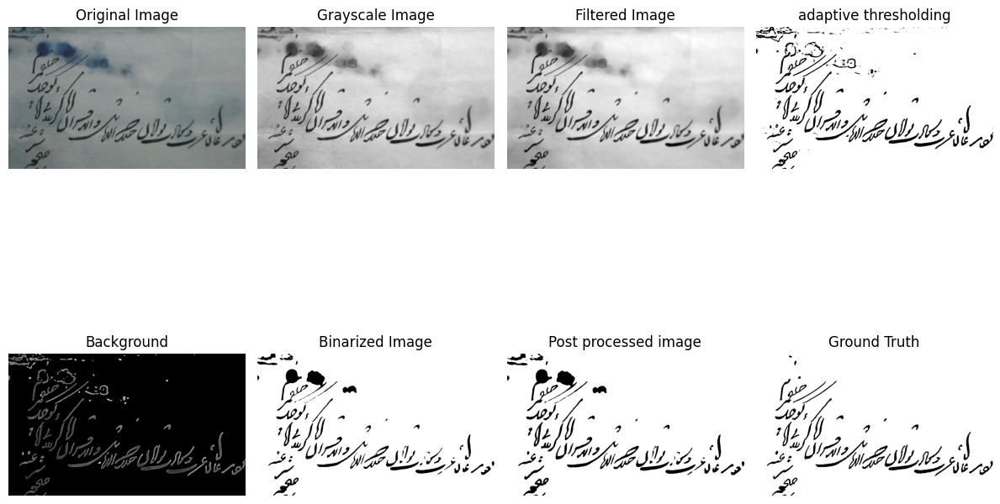

Intersection over Union (IoU): 0.6508324285197249
F1 Score: 0.7884899967619078
Binarization complete for Persian13.jpg


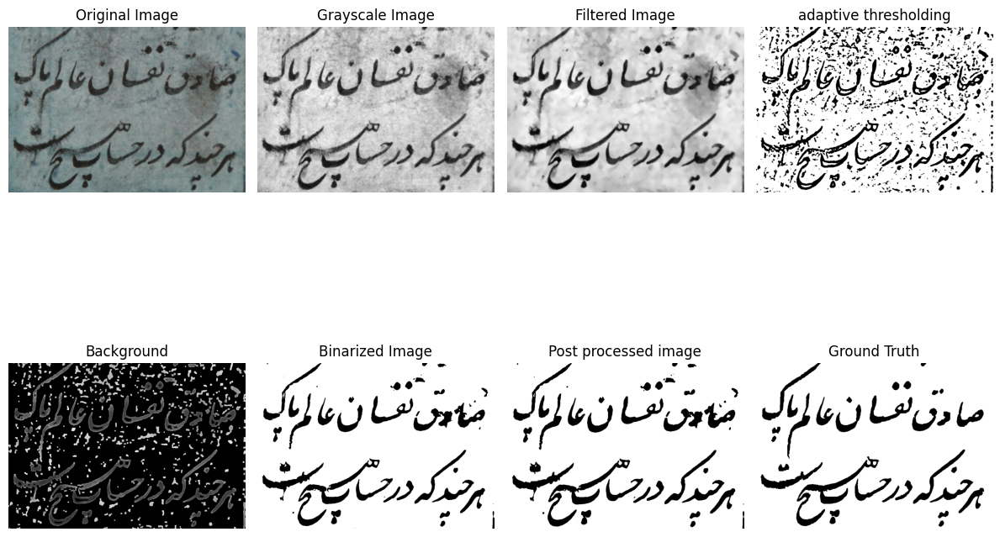

Intersection over Union (IoU): 0.8404479018842126
F1 Score: 0.9133080056910869
Binarization complete for Persian14.jpg


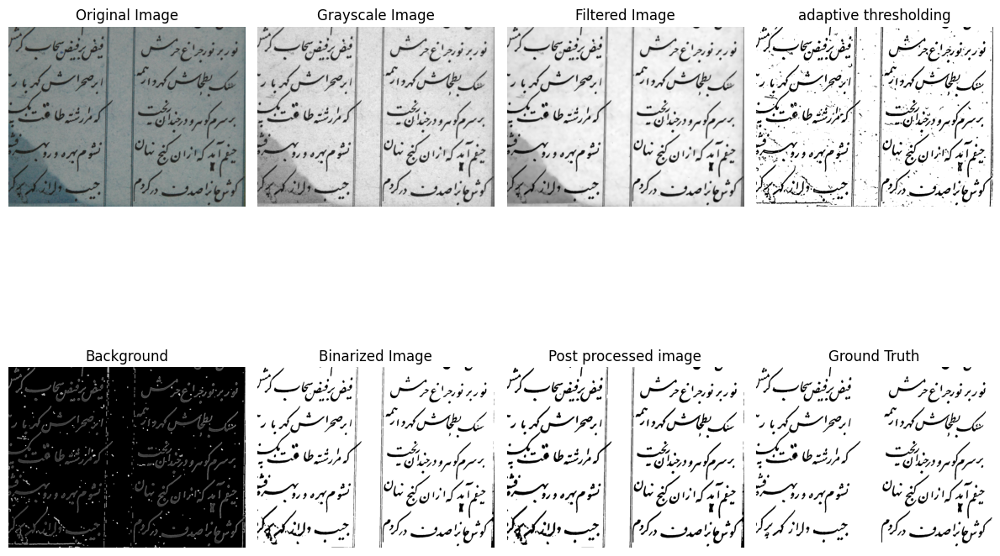

Intersection over Union (IoU): 0.7877399055569002
F1 Score: 0.8812690287469478
Binarization complete for Persian15.jpg


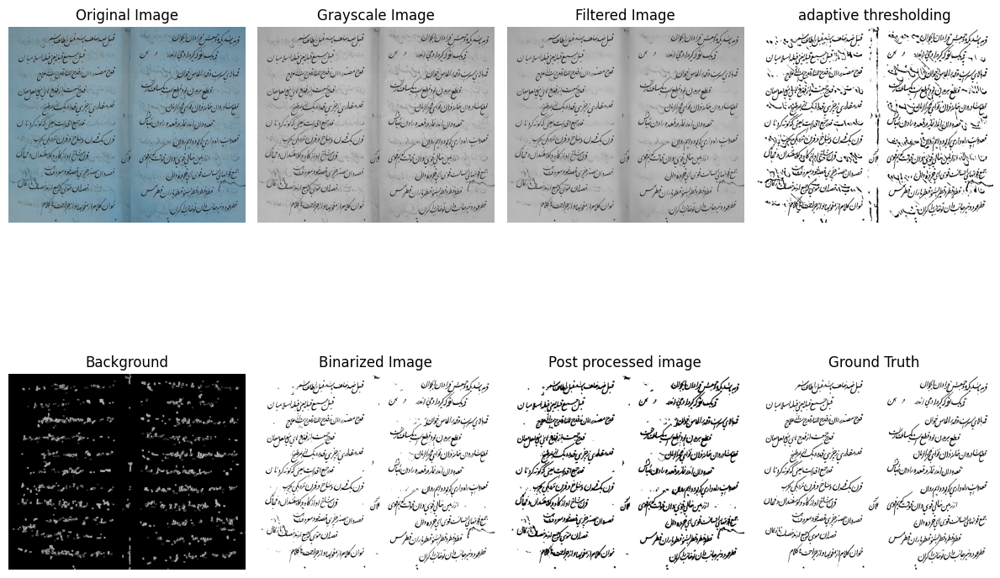

Intersection over Union (IoU): 0.8281006109797975
F1 Score: 0.9059683100037179
Binarization complete for Persian02.jpg


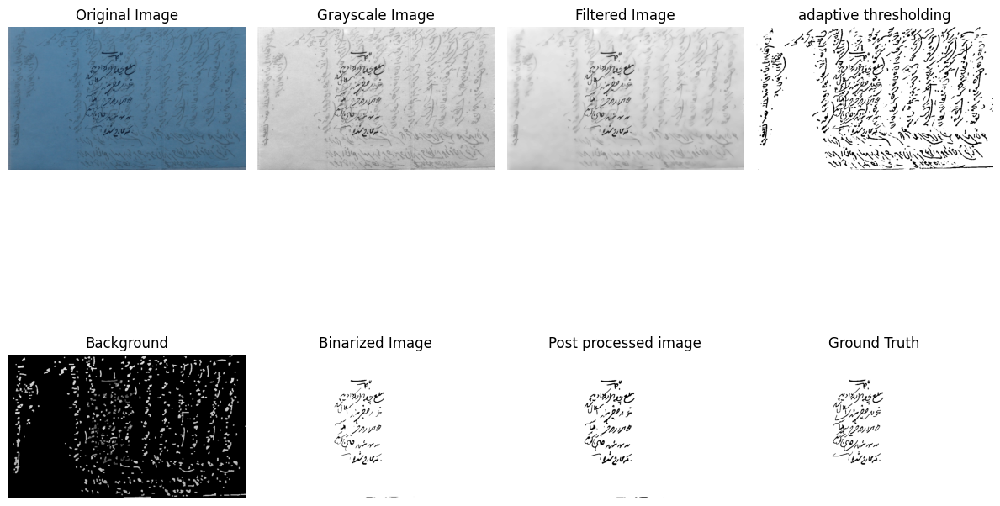

Intersection over Union (IoU): 0.7085257426424978
F1 Score: 0.8294001366681529
Binarization complete for Persian08.jpg


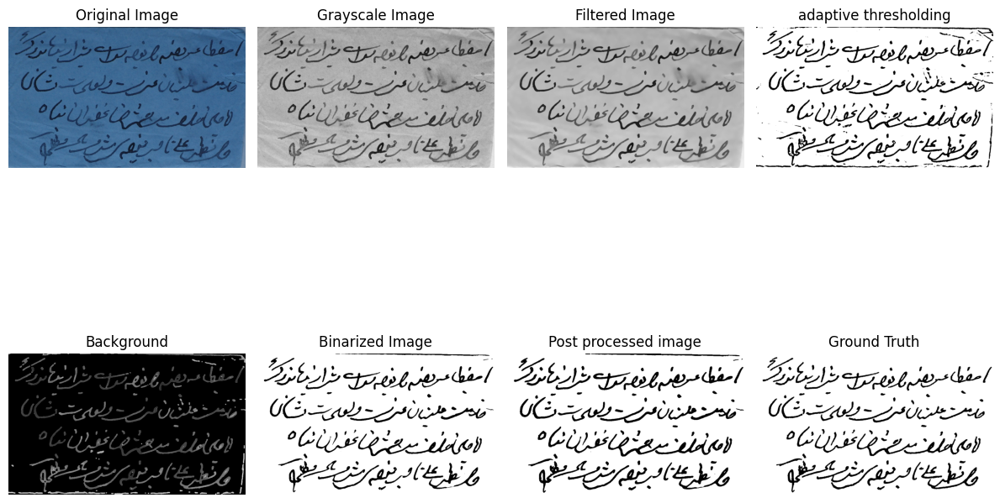

Intersection over Union (IoU): 0.8713978535911072
F1 Score: 0.9312801673371294
Binarization complete for Persian04.jpg


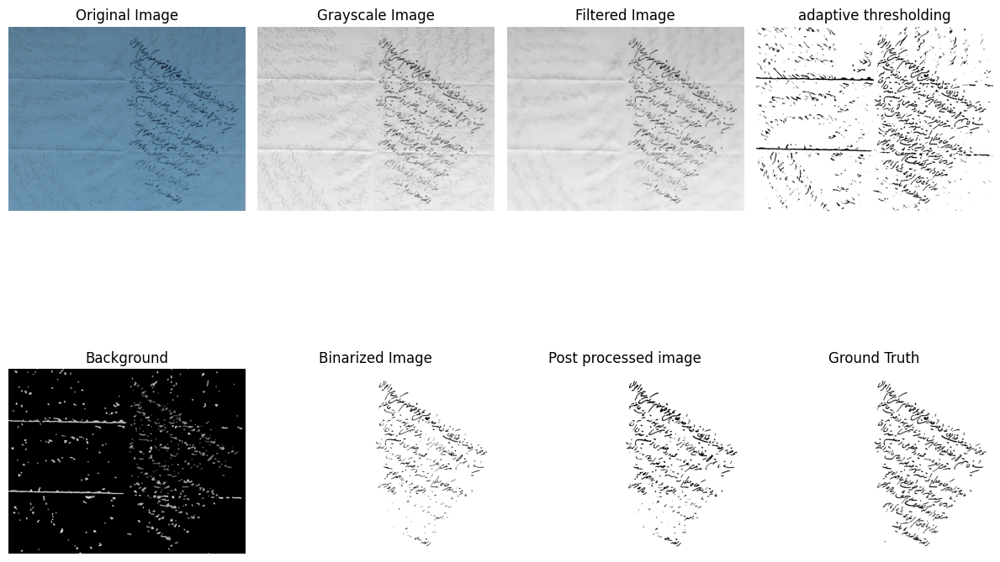

Intersection over Union (IoU): 0.5324328336054623
F1 Score: 0.6948857027607215
Binarization complete for Persian03.jpg


In [ ]:
import os
# Path to folder containing images
image_folder = "/content/drive/MyDrive/Colab Notebooks/CV_assignment_1/Original"

# Path to folder containing ground truth images
ground_truth_folder = "/content/drive/MyDrive/Colab Notebooks/CV_assignment_1/GT"

# Iterate over each image in the folder
for filename in os.listdir(image_folder):
    if filename.endswith(".jpg") or filename.endswith(".png"):  # Ensure only image files are processed
        # Load the image
        img_path = os.path.join(image_folder, filename)
        img = cv2.imread(img_path)

        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        filtered_image = cv2.fastNlMeansDenoising(gray, None, h=10, templateWindowSize=7, searchWindowSize=21)

        # Display grayscale conversion result
        plt.figure(figsize=(12, 10))
        plt.subplot(2, 4, 1)
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(2, 4, 2)
        plt.imshow(gray, cmap='gray')
        plt.title("Grayscale Image")
        plt.axis('off')


        # Display noise reduction result
        plt.subplot(2, 4, 3)
        plt.imshow(filtered_image, cmap='gray')
        plt.title("Filtered Image")
        plt.axis('off')

        thresh = cv2.adaptiveThreshold(filtered_image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blockSize=15, C=2)
        #Background estimation using morphological operations
        kernel = np.ones((3, 3), np.uint8)
        opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=2)
        closing = cv2.morphologyEx(opening, cv2.MORPH_CLOSE, kernel, iterations=2)
        # Threshold refinement
        background = cv2.subtract(filtered_image, closing)
        plt.subplot(2, 4, 5)
        plt.imshow(background, cmap='gray')
        plt.title("Background")
        plt.axis('off')
        foreground, background = np.amin(filtered_image), np.amax(background)
        threshold = (foreground + background) / 2

        #Displaying morphological operations
        plt.subplot(2, 4, 4)
        plt.imshow(thresh, cmap='gray')
        plt.title("adaptive thresholding")
        plt.axis('off')

        # Final binarization
        binary_image = cv2.threshold(filtered_image, threshold, 255, cv2.THRESH_BINARY)[1]
        plt.subplot(2, 4, 6)
        plt.imshow(binary_image, cmap='gray')
        plt.title("Binarized Image")
        plt.axis('off')

        # Post processing
        # Dilation followed by erosion
        kernel = np.ones((2,2),np.uint8)

        dilation = cv2.erode(binary_image, kernel, iterations=2)
        erosion = cv2.dilate(dilation, kernel, iterations=1)
        plt.subplot(2, 4, 7)
        plt.imshow(erosion, cmap='gray')
        plt.title("Post processed image")
        plt.axis('off')

        # Load ground truth image for evaluation
        ground_truth_path = os.path.join(ground_truth_folder, filename[:-3]+"png")
        if os.path.exists(ground_truth_path):
            ground_truth = cv2.imread(ground_truth_path)
            #cv2_imshow(ground_truth)
            plt.subplot(2, 4, 8)
            plt.imshow(ground_truth, cmap='gray')
            plt.title("Ground Truth")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            evaluate_binarization(ground_truth, binary_image)
        else:
            print("Ground truth not found for", filename)

        print("Binarization complete for", filename)